# Imports

In [3]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1"

%reload_ext autoreload
%autoreload 2
%matplotlib notebook

import sys
sys.path.append('../../../third_party_repos/')
sys.path.append('../../wsi_processing_pipeline/')
sys.path.append('../../wsi_processing_pipeline/tile_extraction/')
import wsi_processing_pipeline
import tile_extraction
from wsi_processing_pipeline.tile_extraction import slide, filter, tiles, util
#import wsi_processing_pipeline

import slide, filter, tiles, util
import pathlib
from pathlib import Path, PosixPath



import sklearn
import fastcore
import fastai2
from nbdev.showdoc import show_doc
from fastai2.vision.all import *
import pathlib
from pathlib import Path
import pretrainedmodels
from pretrainedmodels import *
import time
import scandir
from typing import Dict
import pandas as pd
import numpy as np
import os
import torch
import torchvision
from torchvision.models import *
from torchsummary import summary
from functools import partial, update_wrapper
from tqdm import tqdm_notebook as tqdm
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
import shutil
from sklearn.model_selection import StratifiedKFold, KFold
from typing import List, Callable
from PIL import Image
torch.backends.cudnn.benchmark=True

Image.MAX_IMAGE_PIXELS = 10000000000   

PNG_BASE_DATAPATH = Path('/home/Deep_Learner/private/datasets/Kranios/tiles')
PATH = Path('/home/Deep_Learner/private/Kraniopharyngeome/')
WSI_BASE_PATH = Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/')
ROIS_PATH=Path(WSI_BASE_PATH/'rois_experimenting')
MODEL_PATH_NAME = 'models'
MODEL_PATH = PATH/MODEL_PATH_NAME


#sz = 512
#bs = 16

#fastai defaults
#tta_beta = 0.4 
#tta_scale = 1.35
#dropout = 0.5
#wd = 0.01

#non defaults
#wd = 0.1 not better for se_resnext50
#dropout = 0.9

seed = 19
np.random.seed(seed)


# FilesGetter cls 


In [4]:
class FilesGetter(object):
        
    def get_dirs_and_files(self,
                           path=None, 
                           folder_name=None, 
                           suffix=None,
                           get_dirs=False,
                           get_files=True, 
                           recursive=True, 
                           followlinks=True, 
                           match=True,
                           file_regex=None):
        "Get all the files or folders in `path` with optional `extensions`, optionally with `recurse`, only in `folders`, if specified."
        
        results=precheck(types=['path', 'string', 'bool'],
                      path={'path':path} , 
                      string={'folder_name':folder_name                                                                           
                                      },
                      bools={'recursive': recursive,
                            'followlinks': followlinks,
                            'get_files': get_files,
                            'match':match}
                      )
        
        if folder_name:            
            path,folder_name = results[0],results[1]   
        else:
            path = results[0]
        folder_name=L(folder_name)    
        suffix = setify(suffix)
        suffix = {e.lower() for e in suffix}
        res = L([]) 
        if get_files:
            fls = []  
        if recursive:
            if not path.is_dir():
                return [path]                       
            
            for p,d,f in tqdm(scandir.walk(str(path), followlinks=followlinks)): # returns (dirpath, dirnames, filenames)                   
                
                #if len(folder_name) !=0: d[:] = [o for o in d if o in folder_name]
                #else:                    d[:] = [o for o in d if not o.startswith('.')]
                if len(folder_name) !=0:                   
                    
                    for fn in folder_name:                          
                        if match:  
                            pattern=fr'{os.path.sep}{fn}$'
                        else:
                            pattern=fr'{fn}'                            
                        if re.compile(pattern).search(p) and not re.compile(fr'{os.path.sep}(\.)').search(p):                               
                            res.append(Path(str(p)))
                            if get_files:
                                fls += fastai2.data.transforms._get_files(p, f, suffix)                  
                    
                else:
                    if not p.startswith('.') and not re.compile(fr'{os.path.sep}(\.)').search(p):
                        res.append(Path(p))
                        if get_files:
                            fls += fastai2.data.transforms._get_files(p, f, suffix)               
      
        else:                    
            res = [Path(o.path) for o in os.scandir(path) if o.is_dir() and not o.name.startswith('.')]            
            if len(res)==0 and path.is_dir():
                res=path
            
            if get_files:
                fs = [o.name for o in os.scandir(path) if o.is_file()]
                fls += fastai2.data.transforms._get_files(path, fs, suffix)
        
                    
        if get_files and not get_dirs:
            fls=L(fls) 
            if file_regex:                
                fls=L([Path(p) for p in fls if re.compile(file_regex).search(str(p))])        
            return fls
        elif get_files and get_dirs:
            fls=L(fls) 
            if file_regex:                
                fls=L([Path(p) for p in fls if re.compile(file_regex).search(str(p))])        
            return fls, res            
        else:            
            return res
        
def presetter(variables={}, cls=None):
        ''' This is just to preset variables in the functions within the class; no checks are made here'''
        if cls is None:raise ValueError
        if variables!={} and isinstance(variables,dict):    
            for key,value in variables.items():
                if value:
                    setattr(cls, key, value)
        else:raise ValueError    
            
def precheck(**kwargs): 
        '''This function prechecks the different types within the class:
        NoneType is not checked for!!
        "types": divided into "path" for path-like objects, "str-int" for string or integer like objects and "bool" for boolian types.
        
        within these 
        
        "path" is a dictionary named "path" and has the keys
                path= takes string like or PosixPath objects or which may reside within a list.
        
        "string": is a dictionary containing attributes to be checked whether they are of type string or as alist of strings
                 they can than be added to self or not.
        
        "integer":is a dictionary containing attributes to be checked whether they are of type int or as a list of ints
                 they can than be added to self or not.
        
        str-or-int: is a dictionary containing attributes to be checked whether they are of type int or string or as a list of ints
                     or strings they can than be added to self or not.        
            
        "cls": if this is added path, string, integer or str-or-int attributes will be set and added to this!.. for instance if you
               add the self attribute"
               
        "bool" parameters should be set as type boolian 
        
            '''
        results=[]
        if 'path' in kwargs['types']: 
            for key, value in kwargs['path'].items():
                
                #    raise ValueError('Please specify a path or a list of paths as "string" or "pathlib.PosixPath" objects')
                #print(type(value))
                if isinstance(value,str):
                    value=Path(value)
                elif isinstance(value, pathlib.PosixPath):
                    pass                
                elif isinstance(value, list):
                    if any(isinstance(el, str) for el in value):
                        value=[Path(el) for el in value] 
                    elif any(isinstance(el, pathlib.PosixPath) for el in value):
                        value=[el for el in value]
                    else:
                        raise ValueError('Please specify a path or a list of paths as "string" or "pathlib.PosixPath" objects')      
                     
                else:
                    raise ValueError('Please specify a path or a list of paths as "string" or "pathlib.PosixPath" objects')    
                           
                #setattr(kwargs['classes'], key, value)
                if 'cls' in kwargs['types']:
                    setattr(kwargs['cls'], key, value)
                else:
                    results.append(value)
                
        if 'string' in kwargs['types']:             
            for key, value in kwargs['string'].items(): 
                if isinstance(value,NoneType):
                    if 'cls' in kwargs['types']:
                        setattr(kwargs['cls'], key, [value])
                    else:    
                        results.append([value] )
                    
                elif not isinstance(value, list) and not isinstance(value,fastcore.foundation.L):     
                    if isinstance(value, str) :
                            pass                           
                        #
                    else:    
                        raise ValueError(f'Please specify the parameter {key} as a string or as a list of strings and not as {type(value)})!') 
                    
                    if 'cls' in kwargs['types']:
                        setattr(kwargs['cls'], key, [value])
                    else:    
                        results.append([value] )      

                elif isinstance(value, list) or isinstance(value,fastcore.foundation.L):                   
                          
                    ls=[]
                    if any(isinstance(el, NoneType) for el in value):
                        for parts in value:
                            ls.append(parts)
                    
                    else:
                        for parts in value:                
                            #if key=='labels' or key =='keys':

                            if isinstance(parts, str):                                                                   
                                        #pass
                                ls.append(parts)                          
                            else:
                                raise ValueError(f'Please specify the parameter {key} as a string/integer or as a list of strings/integers!')
                    #ls=[item for item in ls]  
                    if 'cls' in kwargs['types']:
                        setattr(kwargs['cls'], key, ls)
                    else:    
                        results.append(ls)                                                                                                  
                    #setattr(kwargs['classes'], key, ls)              
                
        if 'integer' in kwargs['types']:             
            for key, value in kwargs['integer'].items():
                if isinstance(value,NoneType):
                    if 'cls' in kwargs['types']:
                        setattr(kwargs['cls'], key, [value])
                    else:    
                        results.append([value] )
                elif not isinstance(value, list) and not isinstance(value,fastcore.foundation.L): 
                    try:
                            value = int(value)
                    except:                        
                            raise ValueError(f'Please specify the parameter {key} as an integer or as a list of integers!')        
                                                                  
                       # setattr(kwargs['classes'], key, [value])  
                    if 'cls' in kwargs['types']:
                        setattr(kwargs['cls'], key,[value])
                    else:    
                        results.append([value] )          

                elif isinstance(value, list) or isinstance(value,fastcore.foundation.L):                   
                          
                    ls=[]
                    if any(isinstance(el, NoneType) for el in value):
                        for parts in value:
                            ls.append(parts)
                    
                    else:
                        for parts in value: 
                            try:
                                    parts= int(parts)
                                    ls.append(parts)
                            except:                        
                                    raise ValueError(f'Please specify the parameter {key} as an integer or as a list of integers!')   
                         
                    #ls=[item for item in ls]  
                    if 'cls' in kwargs['types']:
                        setattr(kwargs['cls'], key, ls)
                    else:
                        results.append(ls)                  
                
                        
        if 'str-or-int' in kwargs['types']:             
            for key, value in kwargs['str_or_int'].items():
                if isinstance(value,NoneType):
                    if 'cls' in kwargs['types']:
                        setattr(kwargs['cls'], key, [value])
                    else:    
                        results.append([value] )
                        
                elif not isinstance(value, list) and not isinstance(value,fastcore.foundation.L):                                   
                
                    if isinstance(value, str) or isinstance(value, int) :                        
                            #pass
                        if 'cls' in kwargs['types']:
                            setattr(kwargs['cls'], key, [value])    
                        else:
                            results.append([value])                   
                    else:
                        raise ValueError(f'Please specify the parameter {key} as a string/integer or as a list of strings/integers!')                           
                elif isinstance(value, list) or isinstance(value,fastcore.foundation.L):
                    ls=[]
                    if any(isinstance(el, NoneType) for el in value):
                        for parts in value:
                            ls.append(parts)
                    
                    else:
                        for parts in value:                
                        #if key=='labels' or key =='keys':
                            if isinstance(parts, str) or isinstance(parts, int):                                                                   
                                        #pass
                                ls.append(parts)                          
                            else:
                                raise ValueError(f'Please specify the parameter {key} as a string/integer or as a list of strings/integers!')
                    #ls=[item for item in ls]        
                    if 'cls' in kwargs['types']:
                        setattr(kwargs['cls'], key, ls)
                    else:
                        results.append(ls)
                    
        if 'bool' in kwargs['types']:            
            for key, value in kwargs['bools'].items():                 
                if not isinstance(value, bool):
                    raise ValueError(f'Please specify the parameter {key} as type "bool"; "True" or "False"') 
        
        return results





       
     

First let us have a look at our folders and files within... we can use the class "FilesGetter" for that...
we can also and should look at the folders with "get_dirs_and_files" let us have a look

In [5]:
png_dirs=FilesGetter().get_dirs_and_files(path=PNG_BASE_DATAPATH, 
                                folder_name=None, 
                                suffix=None,
                                get_files=True, 
                                recursive=True, 
                                followlinks=True, 
                                match=True)


/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/ipykernel_launcher.py:39: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


In [88]:
png_dirs

(#2217614) [Path('/home/Deep_Learner/private/datasets/Kranios/tiles/resnext101_32x8d.pkl'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel113.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel122.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel124.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel135.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel142.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel172.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.4

The function returns a fastai List type with all folders (without the hidden ones)... you may use recursive or return files 
found recursively or not... you may even specify specific folders to look for files with exact match or only if the folder name contains the name 
given to the paramter folder_name which takes a list of odlers as well....

if we specified for instance 'aCP' and 'pCP' and 'RCC' without exact lookup match this would be the result

In [89]:
list(FilesGetter().get_dirs_and_files(path=PNG_BASE_DATAPATH, 
                                folder_name=['aCP', 'RCC', 'pCP'], 
                                suffix=None,
                                get_files=False, 
                                recursive=True, 
                                followlinks=True, 
                                match=False))

/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/ipykernel_launcher.py:39: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


[Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Tumor'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1201_17_II_HE'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1201_17_II_HE/Epithel'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1201_17_II_HE/Tumor'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1260_16_Z_HE'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1260_16_Z_HE/Epithel'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1260_16_Z_HE/Tumor'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1265_17_III_HE'),
 Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1265_17_III_HE/Epithel'),
 Path('/home/Deep_Learne

ok we will now extract all '.png' WSI slides from 'aCP' and 'pCP' and 'RCC' base and 'Epithel' subfolder with exact match...

In [6]:
png_files=FilesGetter().get_dirs_and_files(path=PNG_BASE_DATAPATH, 
                                folder_name=['Epithel'], 
                                suffix='.png',
                                get_files=True, 
                                recursive=True, 
                                followlinks=True, 
                                match=True,
                                #file_regex=fr'HE' ### in additon here we have to filter out all slides which are not the HE slides 
                                                  )
png_files

/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/ipykernel_launcher.py:39: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


(#147313) [Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel113.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel122.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel124.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel135.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel142.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel172.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel178.png'),Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aC

In [93]:
len(png_files)

147313

we have a total of 147313 images within these folders (with subfolders included) 

images may have a specific slide id for identification of from which slide they where extracted from 
additionally slides derive from different patients which should be identified in order to get a train test split on the patients
which we will be identifying by a specific case id and or patient id (as sometimes a patient has followup surgery and therfore two or more case ids...)

let us now get an overview of the cases (in our case also patients) and the slides associated with them...

In order to do so... we will look at the structure of the paths of the files we already extracted 

We will be using another class for that... NameGetter() 

#  NameGetter cls

In [100]:
class NameGetter(object):
    '''This class provides utility functions around the issue of naming files and directories from objects 
    found in any path'''
    
    
    def __init__(self,
                 path=None, 
                 path_parts=None, 
                 n_split_returns=None, 
                 splitter=None, 
                 joiner=None, 
                 rm_correctors=None, 
                 path_to_patient_mapping=None,
                 patient_to_path_mapping=None,
                 names=None,
                 classification_labels=None, 
                 keys=None):      
           
               
         
        self.path=path 
        self.path_parts=path_parts
        self.n_split_returns=n_split_returns 
        self.splitter=splitter 
        self.joiner=joiner 
        self.rm_correctors= rm_correctors                 
        self.path_to_patient_mapping= path_to_patient_mapping
        self.patient_to_path_mapping= patient_to_path_mapping
        self.names=names
        self.classification_labels=classification_labels 
        self.keys=keys
        
    def set_patient_id(self, path=None, patient_ids=None, key='path'):        
        if path==None:
            path=self.path
        if not isinstance(path, list):
            path=[path]
        if patient_ids==None:
            print('Patient ID has not been specified!')
            patient_ids=[None] * len(path)  
        zipbObj = zip(path, patient_ids)
        # Create a dictionary from zip object
        self.path_to_patient_mapping=dict(zipbObj)
        if key=='path':    
            return self.path_to_patient_mapping
        else:
            self.patient_to_path_mapping={l:n for n,l in self.path_to_patient_mapping.items()}
            return self.patient_to_path_mapping
    
    def get_patient_id(self, path, patient_ids=None ):    
        if self.path_to_patient_mapping:     
            if isinstance(path, list):
                return [self.path_to_patient_mapping[p] for p in path]
            else:
                return self.path_to_patient_mapping[path]
        else:
            self.set_patient_id(path, patient_ids)
            if isinstance(path, list):
                return [self.path_to_patient_mapping[p] for p in path]
            else:
                return self.path_to_patient_mapping[path]
            
       
    def create_named_object(self, path, patient_id, case_id, slide_id, classification_labels):
        if not isinstance(path, list):
            path=[path]
        if not isinstance(patient_id, list):
            patient_id=[patient_id] 
        if not isinstance(case_id, list):
            case_id=[case_id]    
        if not isinstance(slide_id, list):
            slide_id=[slide_id] 
        if not isinstance(classification_labels, list):
            classification_labels=[classification_labels]     
        
        named_objects=[NamedObject().create(path=p,
                 patient_id=p_id,
                 case_id=c_id,
                 slide_id=s_id,
                 classification_labels=c_l)for p, p_id, c_id, s_id, c_l in tqdm(zip(path,patient_id,case_id,slide_id, classification_labels))]
        
        return named_objects
    
    def create_named_object_from_path(self,
                                      path=None,
                                      patient_id_getter=None,
                                      case_id_getter=None,
                                      slide_id_getter=None,
                                      classification_labels_getter=None):
        presetter(variables={'path':path                             
                             },
                             cls=self
                             )
        precheck(types=['path'], 
                      path={'path':self.path
                           },
                     cls=self)
        
        paths, patient_id, case_id, slide_id, classification_labels =self.get_ids_from_path(path=self.path,
                                                            patient_id_getter=patient_id_getter,
                                                            case_id_getter=case_id_getter,
                                                            slide_id_getter=slide_id_getter,
                                                            classification_labels_getter=classification_labels_getter)
       
           
        named_objects=self.create_named_object(paths, patient_id, case_id, slide_id, classification_labels)
        
        return named_objects            
    
    
    def get_ids_from_path(self, 
                          path=None,
                          patient_id_getter=None,
                          case_id_getter=None,
                          slide_id_getter=None,
                          classification_labels_getter=None):
        
        presetter(variables={'path':path                             
                             },
                             cls=self
                             )
        precheck(types=['path'], 
                      path={'path':self.path
                           },
                     cls=self)        
        if not isinstance(path, list):
            path=[path]
        if not patient_id_getter:
            patient_id = self.get_patient_id(self.path)
        if patient_id_getter:
            patient_id=patient_id_getter(self.path)
        if not case_id_getter:
            case_id = [None] * len(path)     
        if case_id_getter:
            case_id=case_id_getter(self.path)
        if not slide_id_getter:            
            slide_id = [None] * len(path)  
        if slide_id_getter:            
            slide_id=slide_id_getter(self.path)
        if not classification_labels_getter:            
            classification_labels = [None] * len(path) 
        if classification_labels_getter:            
            classification_labels = classification_labels_getter(self.path)              
        
        return self.path, patient_id, case_id, slide_id, classification_labels
    
    
    def create_named_object_from_df(self, df):
        paths, patient_id, case_id, slide_id, classification_labels = self.get_ids_from_df(df)            
        named_objects=self.create_named_object(paths, patient_id, case_id, slide_id, classification_labels)        
        return named_objects   
        
    def get_ids_from_df(self,df=None):
        path = df.path.tolist()
        patient_id = df.case.patient_id.tolist()
        case_id = df.case_id.tolist()
        slide_id = df.slide_id.tolist()
        classification_labels = df.classification_labels.tolist()
        #if not any(isinstance(el, NoneType) for el in case_id) and not any(isinstance(el, NoneType) for el in slide_id):
        return path, patient_id, case_id, slide_id, classification_labels
        #elif any(isinstance(el, NoneType) for el in case_id) and not any(isinstance(el, NoneType) for el in slide_id):    
        #    return path, patient_id, None, slide_id    
     
    
    def get_name_from_path(self, 
                           path=None, 
                           path_parts=None, 
                           n_split_returns=None, 
                           splitter=None, 
                           joiner=None, 
                           unique=False, 
                           rm_correctors=None,
                           keep_split=False,
                           regex=None,                           
                           match=False):          
        '''Function that takes         
        "path": pathlib or string object or as list
        "path_parts: integer or as alist of integers defining parts of splitted path"
        "n_split_returns: Number of splitted parts to return of the modified path defined as integer or list of integers
        "splitter" and "joiner" strings for splitting and joining the path_parts
        "unique": boolean for getting modified processed paths as set or pure list: may contain duplicate entries
        "rm_correctors" string or list of strings to strip of off the modified processed path adjusted with the parameter
        "remove:"boolean whether to just strip the rm_corrector off or to leave out the complete path_part containing the rm_corrector
        "regex": is a regular expressions pattern used with fast.ais class RegexLabeller--> this overwrites the other methods!!
                additionally ajustable with 
        "match": boolean whether re.match or re.search is used within the RegexLabeller  
        
        
        returns:
            a string object modified from initial path_parts            
    
        '''
        presetter(variables={'path':path, 
                             'path_parts':path_parts, 
                             'n_split_returns':n_split_returns, 
                             'splitter':splitter, 
                             'joiner':joiner, 
                             'rm_correctors':rm_correctors
                             },
                             cls=self
                             )
        precheck(types=['path', 'string', 'integer', 'bool'], 
                      path={'path':self.path
                           }, 
                      string={'splitter':self.splitter,
                              'joiner': self.joiner ,
                             'rm_correctors': self.rm_correctors
                             },  
                      integer={'path_parts':self.path_parts,
                               'n_split_returns':self.n_split_returns                                                              
                              },                                        
                      bools={'unique':unique, 
                             'keep_split':keep_split,
                             'match':match
                            },
                     cls=self)
        
                
                    
        if isinstance(self.joiner, list): 
            if len(self.splitter)==1:
                self.joiner=self.joiner[0]
            else:
                raise NotImplementedError
                
        if isinstance(self.splitter, list): 
            if len(self.splitter)==1:
                self.splitter=self.splitter[0]
            else:
                raise NotImplementedError   
        
        if isinstance(path, list)  or isinstance(path,fastcore.foundation.L):
           
            return_path=self.get_names_from_paths(paths=self.path, 
                                      path_parts=self.path_parts, 
                                      splitter=self.splitter, 
                                      joiner=self.joiner, 
                                      n_split_returns=self.n_split_returns,
                                      unique=unique,
                                      rm_correctors=self.rm_correctors,
                                      regex=regex,
                                      keep_split=keep_split
                                                 )            
            
        else: 
            
            if regex:                 
                f= RegexLabeller(regex, match=match)
                return_path = f(str(self.path)) 
                
            else:               
                try: 
                    
                    return_path=self.joiner.join([self.path.parts[i] for i in self.path_parts]).split(self.splitter) 
                    
                    if not isinstance(self.rm_correctors, NoneType): 
                        if isinstance(self.rm_correctors,list): 
                            #if not any(isinstance(el, NoneType) for el in self.rm_correctors):
                        
                            parts_to_check=[return_path[i] for i in self.n_split_returns]
                            return_path,n_split_returns=self.rm_corrector(parts_to_check, keep_split=keep_split) 
                            return_path=str(Path(self.joiner.join([return_path[i] for i in n_split_returns])).with_suffix('')) 
                    else:    
                        return_path=str(Path(self.joiner.join([return_path[i] for i in self.n_split_returns])).with_suffix(''))                                            

                except:
                    raise IndexError('You may want to use the "get_path_parts_and_indices" function  \n'
                              'to precheck your path and to get the parameters "path_parts" splitter", \n'
                               '"joiner" and "n_split_returns" right!')                    
                    
            
          
        return return_path
    
    def rm_corrector(self, parts_to_check, keep_split=False):
        
        '''
        helper function for get_name_from_path:
        takes the path part to be adjusted if 
        "rm_correctors"(list of strings or just string object)
        is set        
        returns list of path objects and list of integers
        '''
        if any(isinstance(el, NoneType) for el in self.rm_correctors):
            raise ValueError('You cannot use this function by itself it is used within other functions!')
        
        precheck(types=[ 'bool'],                       
                      bools={'keep_split':keep_split}
                     )          
             
        rm_correctors=L(self.rm_correctors)
        
        rms='(?:% s)' % '|'.join(rm_correctors)                       
        
        if keep_split:            
            return_path=[re.sub(rms, '', parts)   for parts in parts_to_check]             
            return_path = [x for x in return_path if x]           
        else:
            return_path=[parts for parts in parts_to_check if not re.compile(rms).search(parts) ]
            
        n_split_returns=list(range(len(return_path)))          
        
        return return_path, n_split_returns
        
    def get_names_from_paths(self, 
                             paths=None, 
                             path_parts=None, 
                             n_split_returns=None, 
                             splitter=None, 
                             joiner=None, 
                             unique=False, 
                             regex=None,
                             rm_correctors=None,
                             keep_split=False,
                             match=False):
        
        '''
        
        
        
        
        '''
        
        presetter(variables={'path':paths, 
                             'path_parts':path_parts, 
                             'n_split_returns':n_split_returns, 
                             'splitter':splitter, 
                             'joiner':joiner, 
                             'rm_correctors':rm_correctors},
                             cls=self
                             )  
        precheck(types=['path', 'string', 'integer', 'bool'],
                      path={'path':self.path},
                      string={'splitter':self.splitter,
                              'joiner': self.joiner ,
                             'rm_correctors': self.rm_correctors
                             },  
                      integer={'path_parts':self.path_parts,
                               'n_split_returns':self.n_split_returns                                                              
                              },                                        
                      bools={'unique':unique, 
                             'keep_split':keep_split,
                             'match':match
                            },
                     cls=self) 
        
        paths= [Path(p) if not isinstance(p,pathlib.PosixPath) else p for p in self.path ]            
               
        if unique:            
            result=list(set([self.get_name_from_path(path=ps,
                                                     path_parts=self.path_parts, 
                                                     splitter=self.splitter, 
                                                     joiner=self.joiner, 
                                                     n_split_returns=self.n_split_returns, 
                                                     unique=unique,
                                                     regex=regex,
                                                     rm_correctors=self.rm_correctors,
                                                     keep_split=keep_split,
                                                     match=match) for ps in paths]))
        else:
            result=[self.get_name_from_path(path=ps,
                                            path_parts=self.path_parts, 
                                            splitter=self.splitter, 
                                            joiner=self.joiner, 
                                            n_split_returns=self.n_split_returns, 
                                            unique=unique,
                                            regex=regex,
                                            rm_correctors=rm_correctors,
                                            keep_split=keep_split,
                                            match=match) for ps in paths]
            
        return result    
    
    
    def get_path_parts_and_indices(self, path=None): 
        presetter(variables={'path':path},cls=self)
        
        precheck(types=['path'], 
                      path={'path':self.path} ,
                      classes=self
                     )                              
                          
        if isinstance(self.path, list):
            path_parts=[] 
            res=[]              
            for parts in self.path:               
                parts=list(parts.parts)           
                path_parts.append(parts)
                res.append({i:e for i,e in enumerate(parts)})                             
        else:             
            path_parts=list(self.path.parts)
            res=({i:e for i,e in enumerate(path_parts)})      
        
        return res
        
    def get_path(self):
        precheck(types=['path'], 
                      path={'path':self.path},
                      classes=self
                     )         
       
        return self.path          
    
    def num2lbs(self, 
                classification_labels=None, 
                keys=None):
        presetter(variables={'classification_labels':classification_labels, 
                             'keys':keys,                               
                             },
                             cls=self
                             )
        precheck(types=['str-or-int'],                       
                      str_or_int={'classification_labels':self.classification_labels,
                                      'keys':self.keys                                                                          
                                      },
                     cls=self) 
        
        if self.keys==[None]:
            num2lbs = { i : self.classification_labels[i] for i in range(0, len(self.classification_labels) ) }
            
        elif self.keys!=[]:
            zipbObj = zip( self.keys, self.classification_labels)
        # Create a dictionary from zip object
            num2lbs = dict(zipbObj)
        return num2lbs

    def lbs2num(self):
        return{l:n for n,l in self.num2lbs().items()}    
        
    def label_func(self,
                   names=None,
                   classification_labels=None, 
                   keys=None, 
                   return_list=False, 
                   return_name=False,                                     
                   match=False,
                   multicategory=False):
        
        presetter(variables={'classification_labels':classification_labels, 
                             'keys':keys,
                             'names':names,
                             },
                             cls=self
                             )
                 
        
        precheck(types=['str-or-int', 'bool'],                     
                      str_or_int={'classification_labels':self.classification_labels,
                                   'keys':self.keys,                                      
                                      },
                     bools={'return_list':return_list,
                            'return_name': return_name,                            
                            'match':match,
                            'multicategory':multicategory},
                    cls=self) 
        
        if isinstance(self.keys, NoneType):
            self.keys=[self.keys]
        if multicategory:
            raise NotImplementedError
            
        else:        
                
            if not any(isinstance(el, list) for el in names):
                    
                    if return_list:
                        if return_name:
                            res=[[name] if name in self.classification_labels else [NoneType] for name in names  ]
                        else:
                            res=[[self.lbs2num()[name]] if name in self.classification_labels else [NoneType] for name in names ]
                    else:
                        if return_name: 
                            res=[name if name in self.classification_labels else NoneType for name in names ]
                        else:
                            res=[self.lbs2num()[name] if name in self.classification_labels else NoneType for name in names ]     

            elif any(isinstance(el, list) for el in names):
                    raise NotImplementedError
            else:
                    raise AssertionError            
                
            
            return res 

we will first use the function:"get_path_parts_and_indices"

In [95]:
NameGetter().get_path_parts_and_indices(path=png_files[0])

{0: '/',
 1: 'home',
 2: 'Deep_Learner',
 3: 'private',
 4: 'datasets',
 5: 'Kranios',
 6: 'tiles',
 7: 'aCP',
 8: 'N113_18_Z_HE',
 9: 'Epithel',
 10: 'N113_18_Z_HE - 2019-10-21 15.44.14_Epithel113.png'}

Now we will get the case id from the 7th part of the path and split that with splitter='-' and return "n_plit_returns" in terms of a list of which parts of the splits we want in this case the first two splits... we therby get the case id...
let us try that

In [98]:
NameGetter().get_name_from_path(path=png_files[0], 
                           path_parts=[8], 
                           n_split_returns=list(range(2)), 
                           splitter='_', 
                           joiner='_', 
                           unique=False, 
                           rm_correctors=None,
                           keep_split=True,
                           regex=None,                           
                           match=False)

'N113_18'

In [102]:
case_ids=NameGetter().get_name_from_path(path=list(png_files), 
                           path_parts=[8], 
                           n_split_returns=list(range(2)), 
                           splitter='_', 
                           joiner='_', 
                           unique=False, 
                           rm_correctors=None,
                           keep_split=True,
                           regex=None,                           
                           match=False)
case_ids

['N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N113_18',
 'N1

we have now for all our files the case ids associated with the files... lets see how many unique cases there are 

In [103]:
len(set(case_ids))

172

let us do the same to get the slide ids for the files

In [107]:
slide_ids=NameGetter().get_name_from_path(path=list(png_files), 
                           path_parts=[-3], 
                           n_split_returns=list(range(4)), 
                           splitter='_', 
                           joiner='_', 
                           unique=False, 
                           rm_correctors=['HE'],### strips this off if the last part is "HE" because not all slides have a latin suffix
                           keep_split=False,
                           regex=None,                           
                           match=False)
slide_ids

['N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113_18_Z',
 'N113

In [108]:
len(set(slide_ids))

181

Finally let us get the associated labels here we have "RCC" and "pCP" and "aCP"

In [109]:
set(NameGetter().get_name_from_path(path=list(png_files), 
                           path_parts=[7], 
                           n_split_returns=list(range(1)), 
                           splitter='-', 
                           joiner='_', 
                           unique=False, 
                           rm_correctors=None,
                           keep_split=True,
                           regex=None,                           
                           match=False))


###ok we got 2 labels
###we can assocciate the files with these labels with a utility function called label_func

{'RCC', 'aCP', 'pCP'}

In [91]:
names=NameGetter().get_name_from_path(path=list(png_files), 
                           path_parts=[7], 
                           n_split_returns=list(range(1)), 
                           splitter='-', 
                           joiner='_', 
                           unique=False, 
                           rm_correctors=None,
                           keep_split=True,
                           regex=None,                           
                           match=False)
names

['aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',
 'aCP',


In [92]:
set(names)

{'RCC', 'aCP', 'pCP'}

In [93]:
data_labels=NameGetter().label_func(  names=names,
                                       classification_labels=['aCP', 'pCP', 'RCC'], 
                                       keys=[1,4,5],
                                       return_name=False,                  
                                    )
data_labels   

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


You see here that with the label_func method you can pass optional keys and return them instead of named values
but we will name our enteties from the previous option

let us get all the files and wrap them up and associate all the parameters (ids and labels) to them and get them into a separate Object... the "NamedObject" which can be used with the "ObjectManager" which may also split these objects into a test and training set in order to plug it into the fastai Datablock api... let us see how this works...

In [94]:
class DatasetType(Enum):
    train = 0
    validation = 1
    test = 2    
    
class NamedObject(object):    
    def __init__(self,                 
                 path=None,
                 patient_id=None, 
                 case_id=None, 
                 slide_id=None,
                 classification_labels=None,
                 dataset_type:DatasetType=None
                 ):
        
        self.path=path
        self.patient_id=patient_id
        self.case_id=case_id
        self.slide_id=slide_id
        self.classification_labels=classification_labels
        self.dataset_type=dataset_type
        if isinstance(dataset_type, Enum):
            self.is_valid=True if dataset_type.name=='validation' else False 
        else:
            self.is_valid=None
        
    def create(self, 
               path=None, 
               patient_id=None, 
               case_id=None, 
               slide_id=None,
               classification_labels=None,
               dataset_type:DatasetType=None):
        self.path=path
        self.patient_id=patient_id
        self.case_id=case_id
        self.slide_id=slide_id
        self.classification_labels=classification_labels
        self.dataset_type=dataset_type
        if isinstance(dataset_type, Enum):
            self.is_valid=True if dataset_type.name=='validation' else False 
        else :
            self.is_valid=None
        return self
    
    def export_dataframe(self):
        df = pd.DataFrame(data={
        'path':self.path ,
        'patient_id':self.patient_id,
        'case_id':self.case_id,
        'slide_id':self.slide_id,
        'classification_labels':self.classification_labels,
        'dataset_type':self.dataset_type,
        'is_valid' : is_valid             
            }, index=[0])
        return df

class ObjectManager(object):
    def __init__(self, 
                 objects:list = None,
                 splitter:sklearn.model_selection.train_test_split=None,
                 patient_id_setter=None,
                 case_id_setter=None,
                 slide_id_setter=None
                  ):
        if not isinstance(objects, list):
            objects=[objects]
        self.objects=objects
        self.splitter=splitter
        self.path=[items.path for items in self.objects]
        self.patient_id=[items.patient_id for items in self.objects]
        self.case_id=[items.case_id for items in self.objects]
        self.slide_id=[items.slide_id for items in self.objects]
        self.classification_labels=[items.classification_labels for items in self.objects]
        self.dataset_type=[items.dataset_type for items in self.objects]
        self.is_valid=[items.is_valid for items in self.objects]  
        try:
            self.tiles=[t for obj in self.objects for t in obj.tiles]
            self.tilesummaries=[obj.tilesummary for obj in self.objects]
        except:
            self.tiles=None
            self.tilesummaries=None
        self.patient_id_setter=patient_id_setter
        self.case_id_setter=case_id_setter
        self.slide_id_setter=slide_id_setter
    
    def reset(self):
        self.path=[items.path for items in self.objects]
        self.patient_id=[items.patient_id for items in self.objects]
        self.case_id=[items.case_id for items in self.objects]
        self.slide_id=[items.slide_id for items in self.objects]
        self.classification_labels=[items.classification_labels for items in self.objects]
        self.dataset_type=[items.dataset_type for items in self.objects]
        self.is_valid=[items.is_valid for items in self.objects]  
        try:
            self.tiles=[t for obj in self.objects for t in obj.tiles]
            self.tilesummaries=[obj.tilesummary for obj in self.objects]
        except:
            pass
        
    def convert_to_wsi_or_roi_object(self,
                                     save_tiles=False, 
                                     is_wsi=True, 
                                     tile_score_thresh=0.55,
                                     return_as_tilesummary_object=True,
                                     tile_height=256,
                                     tile_width=256,
                                     tiles_folder_path=None,
                                     tile_naming_func=None    ):           
        
       
        
        wsi_path_to_wsi_info=create_WsiInfo(path=self.path,
                       patient_id=self.patient_id,
                   case_id=self.case_id, 
                   slide_id=self.slide_id,
                   classification_labels=self.classification_labels,
                   dataset_type=self.dataset_type
                      )
        tilesummaries=tiles.WsiOrROIToTilesMultithreaded(
                      wsi_paths=self.path, 
                      tiles_folder_path=tiles_folder_path, 
                      tile_height=tile_height,
                      tile_width=tile_width, 
                      tile_naming_func=tile_naming_func,
                      save_tiles=save_tiles, 
                      is_wsi=is_wsi,
                      tile_score_thresh = tile_score_thresh, 
                      return_as_tilesummary_object=return_as_tilesummary_object,
                      wsi_path_to_wsi_info=wsi_path_to_wsi_info)  
        self.objects=sorted(self.objects, key=lambda x: x.path, reverse=True)
        tilesummaries=sorted(tilesummaries, key=lambda x: x.wsi_path, reverse=True)
        lst=[]
        for summary, objects in zip(tilesummaries, self.objects):            
            objects=WsiOrRoiObject(objects)            
            objects.tilesummary = summary              
            ts=[]
            for t in objects.tilesummary.tiles:            
                t.is_valid=objects.is_valid           
                ts.append(t)
            objects.tilesummary.tiles=ts  
            objects.tiles=objects.tilesummary.top_tiles()
            lst.append(objects)    
            
        self.objects=lst 
        self.reset()
        
         
    def export_dataframe(self):
        if any(isinstance(el, WsiOrRoiObject) for el in self.objects):            
            fname=[]
            labels=[]
            is_valid=[]
            patient_id=[]
            case_id=[]
            slide_id=[]
            path=[]
            dataset_type=[]
                        
            for objects in self.objects: 
                for t in objects.tiles:
                    fname.append(t)
                    labels.append(t.classification_labels)
                    is_valid.append(t.is_valid)
                    patient_id.append(t.patient_id)
                    case_id.append(t.case_id)
                    slide_id.append(t.slide_id)
                    path.append(t.wsi_path)
                    dataset_type.append(t.dataset_type)
                
            df = pd.DataFrame(data={
            'fname':fname ,
            'labels':labels,
            'is_valid':is_valid,
            'patient_id':patient_id,
            'case_id':case_id,
            'slide_id':slide_id,    
            'dataset_type': dataset_type,             
            'path': path             
                })
        else:
            df = pd.DataFrame(data={
            'fname':self.path ,
            'labels':self.classification_labels,
            'is_valid': self.is_valid,
            'patient_id':self.patient_id,
            'case_id':self.case_id,
            'slide_id':self.slide_id,            
            'dataset_type':self.dataset_type,    
            
            })
            
        return df
    
    def split(self, test_size=None, train_size=None, random_state=None, shuffle=True, stratify=None):
        if not any(isinstance(el, NoneType) for el in self.patient_id):
            ids=self.patient_id
            itemid='patient_id'
        else:
            ids= self.case_id  
            itemid='case_id'
           
        ids_train, ids_test = self.splitter(list(set(ids)), 
                                       test_size=test_size,
                                       train_size=train_size,
                                       shuffle=shuffle, 
                                       stratify=stratify, 
                                       random_state=seed)              
        
        
        l=[] 
        
        for item in self.objects:
            if getattr(item, itemid) in ids_test:
                item.is_valid = True 
                item.dataset_type=DatasetType.validation
            else: 
                item.is_valid = False
                item.dataset_type=DatasetType.train
            if isinstance(item, WsiOrRoiObject):
                ts=[]
                for t in item.tilesummary.tiles:
                    t.patient_id=item.patient_id
                    t.case_id=item.case_id
                    t.slide_id=item.slide_id
                    t.dataset_type=item.dataset_type
                    t.is_valid=item.is_valid
                    t.classification_labels=item.classification_labels
                    ts.append(t)            
                item.tilesummary.tiles=ts  
                item.tiles=item.tilesummary.top_tiles()
            l.append(item)            
        self.objects=l
        self.reset()      
        

def create_WsiInfo(path:list,
                   patient_id:list,
                   case_id:list, 
                   slide_id:list,
                   classification_labels:list,
                   dataset_type:list):
    
    wsi_path_to_wsi_info={}
    for pat,pat_id,cas_id,slid_id,cl_lab,dat_typ in zip(path,
                                                        patient_id, 
                                                        case_id, 
                                                        slide_id,
                                                        classification_labels,
                                                        dataset_type):
                        
        wsiinfo=tiles.WsiInfo(patient_id=pat_id,
                                                 case_id= cas_id,
                                                 slide_id=slid_id,
                                                 classification_labels= cl_lab,
                                                 dataset_type=dat_typ)        
        
            
        wsi_path_to_wsi_info[pat]=wsiinfo
        
    return  wsi_path_to_wsi_info   
        
class WsiOrRoiObject(NamedObject):
    
                  
    def __init__(self,
                 no,                          
                ):
        self.no=no
        self.path=no.path 
        self.patient_id=no.patient_id 
        self.case_id=no.case_id
        self.slide_id=no.slide_id
        self.classification_labels=no.classification_labels
        self.dataset_type=no.dataset_type
        self.is_valid=no.is_valid
        self.tile_id=None
        
        super(WsiOrRoiObject, self).__init__(
                 path=self.path,
                 patient_id=self.patient_id, 
                 case_id=self.case_id, 
                 slide_id=self.slide_id,
                 classification_labels=self.classification_labels,
                 dataset_type=self.dataset_type
                 )
        
    def process(self,
                save_tiles=False, 
                is_wsi=True, 
                tile_score_thresh=0.55,
                return_as_tilesummary_object=True,
                tile_height=256,
                tile_width=256,
                tiles_folder_path=None,
                tile_naming_func=None  ):
        
        wsi_path_to_wsi_info=create_WsiInfo(path=[self.path],
                       patient_id=[self.patient_id],
                   case_id=[self.case_id], 
                   slide_id=[self.slide_id],
                   classification_labels=[self.classification_labels],
                   dataset_type=[self.dataset_type]
                      )        
        
        tilesummaries=tiles.WsiOrROIToTilesMultithreaded(
                      wsi_paths=[self.path], 
                      tiles_folder_path=tiles_folder_path, 
                      tile_height=tile_height,
                      tile_width=tile_width, 
                      tile_naming_func=tile_naming_func,
                      save_tiles=save_tiles, 
                      is_wsi=is_wsi,
                      tile_score_thresh = tile_score_thresh, 
                      return_as_tilesummary_object=return_as_tilesummary_object,
                      wsi_path_to_wsi_info=wsi_path_to_wsi_info) 
        
               
        self.tilesummary=tilesummaries[0]
        
        ts=[]   
        
        for t in self.tilesummary.tiles:             
            t.is_valid=self.no.is_valid            
            ts.append(t)
        self.tilesummary.tiles=ts   
        
        self.tiles=[p for p in self.tilesummary.top_tiles()]   

We define all id and label getting functions as outlined above

In [101]:
slide_id_getter=NameGetter(path_parts=[-3], 
                     splitter='_', 
                     joiner='-',            
                     n_split_returns=list(range(4)),
                      rm_correctors=['HE']).get_name_from_path

In [102]:

case_id_getter=NameGetter(path_parts=[-3], 
                     splitter='_', 
                     joiner='-',            
                     n_split_returns=list(range(2)),
                      rm_correctors=['HE']).get_name_from_path


In [103]:
classification_labels_getter=NameGetter(path_parts=[7], 
                     splitter='_', 
                     joiner='-',            
                     n_split_returns=list(range(1)),
                      ).get_name_from_path

Now we use the "create_named_object_from_path" method to get list of named Objects

In [104]:
no=NameGetter().create_named_object_from_path(path=list(png_files), 
                                                   case_id_getter=case_id_getter, 
                                                   slide_id_getter=slide_id_getter,
                                                   classification_labels_getter=classification_labels_getter)

Patient ID has not been specified!


/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/ipykernel_launcher.py:80: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


We get a warning because we have not specified a Patient Id... in our case this is not essential becaus e the case id is sufficient... one case belongs to one patient... this is very important for the train test split!!

Let us have a look at the named objects

In [105]:
dir(no[0])

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'case_id',
 'classification_labels',
 'create',
 'dataset_type',
 'export_dataframe',
 'is_valid',
 'path',
 'patient_id',
 'slide_id']

In [106]:
no[0].case_id  ### se how all is asscoiated with the named object!

'N113-18'

In [107]:
no[0].path

Path('/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N113_18_Z_HE/Epithel/N113_18_Z_HE - 2019-10-21 15.44.14_Epithel113.png')

Now we can put it into the "ObjectManager"

In [108]:
om=ObjectManager(no, splitter=sklearn.model_selection.train_test_split)
### we can pass the list of objects and a splitter for subsequent train test splitting--> here sklearns train_test_split

The ObjectManager contains the NamedObjects and can split them into train and test set and asscoiates these values with the objects

In [109]:
type(om.objects[0].is_valid)###--> is still a None value

NoneType

In [110]:
om.split(test_size=0.1, train_size=None, random_state=None, shuffle=True, stratify=None)

In [111]:
om.objects[0].is_valid###--> is now a boolian whether it is validation (True) or training set (True)

True

And now we are ready to plug all into the Datablock api from Fastai2 !!! 

In [112]:
img_block=DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    #get_items=get_tuple_files,
    get_x=lambda x: x.path , 
    get_y=lambda x: x.classification_labels ,
    splitter= FuncSplitter(lambda x: x.is_valid),
    item_tfms=Resize(224),
    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
)

In [113]:
dls=img_block.dataloaders(om.objects)

<IPython.core.display.Javascript object>


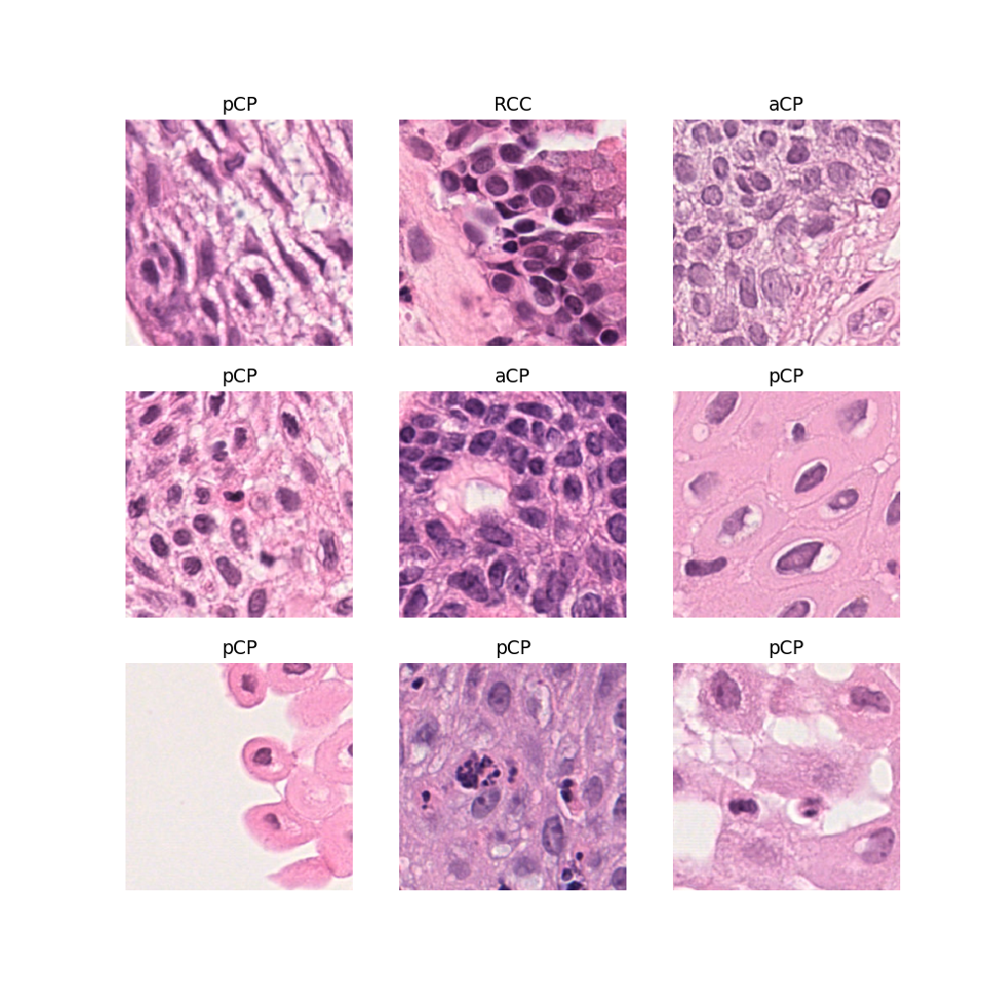

In [43]:
%matplotlib notebook
dls.show_batch()

There exists a convenience function in the ObjectMAnager to export the objects as a pandas Dataframe!

In [136]:
datfr=om.export_dataframe()

In [137]:
datfr[datfr['is_valid']==True]

,fname,labels,is_valid,patient_id,case_id,slide_id,dataset_type
3888,/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1359_17_III1_HE/Epithel/Epithel_1.png,aCP,True,None,N1359-17,N1359-17-III1,DatasetType.validation
3889,/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1359_17_III1_HE/Epithel/Epithel_10.png,aCP,True,None,N1359-17,N1359-17-III1,DatasetType.validation
3890,/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1359_17_III1_HE/Epithel/Epithel_100.png,aCP,True,None,N1359-17,N1359-17-III1,DatasetType.validation
3891,/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1359_17_III1_HE/Epithel/Epithel_101.png,aCP,True,None,N1359-17,N1359-17-III1,DatasetType.validation
3892,/home/Deep_Learner/private/datasets/Kranios/tiles/aCP/N1359_17_III1_HE/Epithel/Epithel_102.png,aCP,True,None,N1359-17,N1359-17-III1,DatasetType.validation
...,...,...,...,...,...,...,...
142439,/home/Deep_Learner/private/datasets/Kranios/tiles/RCC/N459_18_II_HE/Epithel/N459_18_II_HE - 2019-10-25 12.20.04_Epithel73.png,RCC,True,None,N459-18,N459-18-II,DatasetType.validation
142440,/home/Deep_Learner/private/datasets/Kranios/tiles/RCC/N459_18_II_HE/Epithel/N459_18_II_HE - 2019-10-25 12.20.04_Epithel74.png,RCC,True,None,N459-18,N459-18-II,DatasetType.validation
142441,/home/Deep_Learner/private/datasets/Kranios/tiles/RCC/N459_18_II_HE/Epithel/N459_18_II_HE - 2019-10-25 12.20.04_Epithel75.png,RCC,True,None,N459-18,N459-18-II,DatasetType.validation
142442,/home/Deep_Learner/private/datasets/Kranios/tiles/RCC/N459_18_II_HE/Epithel/N459_18_II_HE - 2019-10-25 12.20.04_Epithel8.png,RCC,True,None,N459-18,N459-18-II,DatasetType.validation


See how easily it is plugged in in another way into the Datablock api

In [138]:
img_block=DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    #get_items=get_tuple_files,
    get_x=ColReader('fname') , 
    get_y=ColReader('labels') ,
    splitter= ColSplitter(col='is_valid'),
    item_tfms=Resize(224),
    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
)

In [139]:
dls=img_block.dataloaders(datfr)

<IPython.core.display.Javascript object>


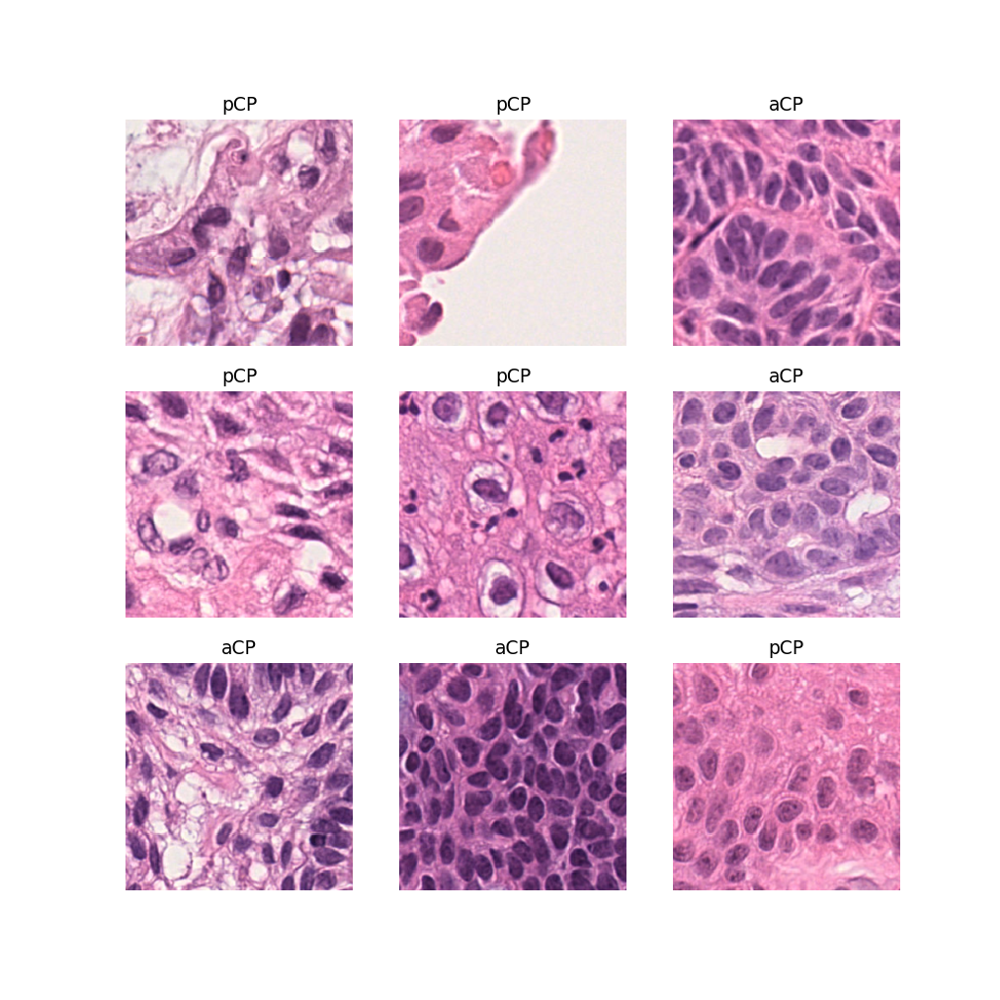

In [140]:
%matplotlib notebook
dls.show_batch()

We could now instantiate a learner and train a neuronal network... however we want to look at another option the ObjectManager manages... additionally in the dataloaders the NamedObject is gone... this is somehow impractical at some point... we will deal with that as well...

In histopathology we do have virtual slides so called WSI objects which are like google maps images so a slide contains a very big image which is broken into small images tiles( much like the images we see above) what if we wanted to take a slide and get all the images from that slide associated so nicely like above... let us have alook the NamedObject gets extended to the WsiorRoiObject and can also be managed by the ObjectManager

In [44]:
WSI_BASE_PATH = Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/')

In [45]:
wsi_files=FilesGetter().get_dirs_and_files(path=WSI_BASE_PATH, 
                                           get_files=True, 
                                           suffix='.ndpi', 
                                           recursive=True, 
                                           folder_name=['gonadotrop', 'corticotrop'],
                                           file_regex=fr'HE')#;dirs

/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/ipykernel_launcher.py:39: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


In [46]:
wsi_files#=wsi_files[:20]

(#431) [Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/365-13-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/2143-15-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1840-13-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/827-18-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1825-13-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/990-17-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1479-16-III-HE.ndpi')...]

We have 431 slides... for this tutorial we will only be using the first 10 and the last 10 slides

In [47]:
#wsi_files[::len(wsi_files)-10]
wsi_files=wsi_files[:10]+wsi_files[-10:]
wsi_files

(#20) [Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/365-13-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/2143-15-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1840-13-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/827-18-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1825-13-III-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/990-17-II-HE.ndpi'),Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1479-16-III-HE.ndpi')...]

In [186]:
list(wsi_files)

[Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/365-13-III-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/2143-15-II-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1840-13-III-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/827-18-III-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1825-13-III-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/990-17-II-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1479-16-III-HE.ndpi'),
 Path('/home/Deep_Learner/shared/Datasets/Hypophysenadenome

In [187]:
NameGetter().get_path_parts_and_indices(path=wsi_files[0])

{0: '/',
 1: 'home',
 2: 'Deep_Learner',
 3: 'shared',
 4: 'Datasets',
 5: 'Hypophysenadenome',
 6: 'corticotrop',
 7: '365-13-III-HE.ndpi'}

In [48]:
wsi_case_id_getter=NameGetter(path_parts=[7], 
                     splitter='-', 
                     joiner='-',            
                     n_split_returns=list(range(2)),
                      ).get_name_from_path

In [49]:
wsi_case_id_getter=NameGetter(path_parts=[7], 
                     splitter='-', 
                     joiner='-',            
                     n_split_returns=list(range(2)),
                      ).get_name_from_path

In [50]:
wsi_slide_id_getter=NameGetter(path_parts=[7], 
                     splitter='-', 
                     joiner='-',            
                     n_split_returns=list(range(3)),
                      rm_correctors=['HE']).get_name_from_path

In [51]:
wsi_classification_label_getter=NameGetter(path_parts=[6], 
                     splitter='-', 
                     joiner='-',            
                     n_split_returns=list(range(1)),
                      ).get_name_from_path

In [52]:
now=NameGetter().create_named_object_from_path(path=list(wsi_files), 
                                                   case_id_getter=wsi_case_id_getter, 
                                                   slide_id_getter=wsi_slide_id_getter,
                                                   classification_label_getter=wsi_classification_label_getter)

Patient ID has not been specified!


/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/ipykernel_launcher.py:80: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


In [53]:
now#[0].path

In [55]:
wsi_om=ObjectManager(now, splitter=sklearn.model_selection.train_test_split)

Till now everythoing was pretty much the same... but now we have whle slide images we now utilize a built in function of the ObjetManger which converts the NAmedObject into a WsiObject which has image tiles associated with it from the tile extraction part seen in tile_exctraciont

In [56]:
wsi_om.convert_to_wsi_or_roi_object()

  0%|          | 0/20 [00:00<?, ?it/s]

Starting to process /home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/365-13-III-HE.ndpi
Starting to process /home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/2143-15-II-HE.ndpi
Starting to process /home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/940-13-II-HE.ndpi
Starting to process /home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1731-16-III-HE.ndpi
Starting to process /home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/827-18-III-HE.ndpi
Starting to process /home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1840-13-III-HE.ndpi
Starting to process /home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1825-13-III-HE.ndpi
Starting to process /home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi
Starting to process /home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/990-17-II-HE.ndpi
Starting to process /home/Deep_Learner/shared/Datasets/Hypophyse

100%|██████████| 20/20 [01:27<00:00,  4.79s/it]

In [198]:
wsi_om.objects[0].tiles[0].case_id

'951-15'

In [57]:
wsi_om.tiles[0].case_id

'951-15'

In [199]:
wsi_om.export_dataframe()## for convenience again a dataframe export

,fname,labels,is_valid,patient_id,case_id,slide_id,dataset_type,path
0,"[Tile #186006, Row #341, Column #366, Tissue 43.75%, Score 0.9890]",gonadotrop,None,None,951-15,951-15-I,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/gonadotrop/951-15-I-HE.ndpi
1,"[Tile #186555, Row #342, Column #369, Tissue 17.19%, Score 0.9821]",gonadotrop,None,None,951-15,951-15-I,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/gonadotrop/951-15-I-HE.ndpi
2,"[Tile #116037, Row #213, Column #285, Tissue 65.62%, Score 0.9582]",gonadotrop,None,None,951-15,951-15-I,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/gonadotrop/951-15-I-HE.ndpi
3,"[Tile #116035, Row #213, Column #283, Tissue 98.44%, Score 0.9515]",gonadotrop,None,None,951-15,951-15-I,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/gonadotrop/951-15-I-HE.ndpi
4,"[Tile #40694, Row #75, Column #290, Tissue 100.00%, Score 0.9489]",gonadotrop,None,None,951-15,951-15-I,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/gonadotrop/951-15-I-HE.ndpi
...,...,...,...,...,...,...,...,...
141273,"[Tile #26091, Row #61, Column #51, Tissue 92.19%, Score 0.5509]",corticotrop,None,None,1328-15,1328-15-I,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi
141274,"[Tile #41691, Row #97, Column #27, Tissue 90.62%, Score 0.5508]",corticotrop,None,None,1328-15,1328-15-I,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi
141275,"[Tile #40392, Row #94, Column #30, Tissue 98.44%, Score 0.5506]",corticotrop,None,None,1328-15,1328-15-I,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi
141276,"[Tile #34628, Row #80, Column #342, Tissue 100.00%, Score 0.5505]",corticotrop,None,None,1328-15,1328-15-I,None,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi


In [200]:
wsi_om.split(test_size=0.1, train_size=None, random_state=None, shuffle=True, stratify=None)

In [201]:
wsi_om.export_dataframe()### now the is_valid and datatype parameter is set

,fname,labels,is_valid,patient_id,case_id,slide_id,dataset_type,path
0,"[Tile #186006, Row #341, Column #366, Tissue 43.75%, Score 0.9890]",gonadotrop,False,None,951-15,951-15-I,DatasetType.train,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/gonadotrop/951-15-I-HE.ndpi
1,"[Tile #186555, Row #342, Column #369, Tissue 17.19%, Score 0.9821]",gonadotrop,False,None,951-15,951-15-I,DatasetType.train,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/gonadotrop/951-15-I-HE.ndpi
2,"[Tile #116037, Row #213, Column #285, Tissue 65.62%, Score 0.9582]",gonadotrop,False,None,951-15,951-15-I,DatasetType.train,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/gonadotrop/951-15-I-HE.ndpi
3,"[Tile #116035, Row #213, Column #283, Tissue 98.44%, Score 0.9515]",gonadotrop,False,None,951-15,951-15-I,DatasetType.train,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/gonadotrop/951-15-I-HE.ndpi
4,"[Tile #40694, Row #75, Column #290, Tissue 100.00%, Score 0.9489]",gonadotrop,False,None,951-15,951-15-I,DatasetType.train,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/gonadotrop/951-15-I-HE.ndpi
...,...,...,...,...,...,...,...,...
141273,"[Tile #26091, Row #61, Column #51, Tissue 92.19%, Score 0.5509]",corticotrop,True,None,1328-15,1328-15-I,DatasetType.validation,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi
141274,"[Tile #41691, Row #97, Column #27, Tissue 90.62%, Score 0.5508]",corticotrop,True,None,1328-15,1328-15-I,DatasetType.validation,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi
141275,"[Tile #40392, Row #94, Column #30, Tissue 98.44%, Score 0.5506]",corticotrop,True,None,1328-15,1328-15-I,DatasetType.validation,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi
141276,"[Tile #34628, Row #80, Column #342, Tissue 100.00%, Score 0.5505]",corticotrop,True,None,1328-15,1328-15-I,DatasetType.validation,/home/Deep_Learner/shared/Datasets/Hypophysenadenome/corticotrop/1328-15-I-HE.ndpi


In [203]:
wsi_om.objects[0].tiles[0].is_valid

False

# TileImage, TileTransforms, TileImageBlock

Now we are going to define some calsses and functions in order to be able to read and display the Tiles extracted as Tile objects 
and stored in the dataframe because they are not yet displayable images like pngs....

In [58]:
def label_tl_image(f):    
            name=f.classification_labels
                
            return name    

def tile_image(tl:wsi_processing_pipeline.tile_extraction.tiles.Tile,                           
                          )->fastai2.vision.data.Image:
            '''This function is just for showcasing.
            It takes a tile object (wsi-preprocessing pipeline) and returns a WsiImage for displaying purposes '''
                       
            name=tl.classification_labels     
            img=TileImage.create(tl)
            return TileImage(img,name)

        
        
        
class TileImage(Tuple):
    '''This class can 
    create a PIL Image from a Tile object.
    additionally the 
    show method enables to display the Tile object as an image'''
    @classmethod
    def create(cls, f): 
        if isinstance (f, NamedObject):
            tile=PILImage.create(f.path) 
        else:            
            wsi_path=f.wsi_path
            x=f.get_x()
            y=f.get_y()         
            width = f.get_width()
            height = f.get_height()
            level = f.level
            tile = tiles.ExtractTileFromWSI(path=wsi_path, x=x, y=y, width=width, height=height, level=level)        
        tile = TensorImage(image2tensor(tile))
        #tile=PILImage.create(tile)
        return tile
    
    def show(self, ctx=None, **kwargs):    
        img,title = self
        if not isinstance(img, Tensor):            
            t = tensor(img)
            t = t.permute(2,0,1)
        else: t = img
        #line = t.new_zeros(t.shape[0], t.shape[1], 10)
        #print(type(t))
        return show_image(t,title=title, ctx=ctx, **kwargs)
        
        
        
        

Let us have a look on how the function displays a Tile object

<IPython.core.display.Javascript object>


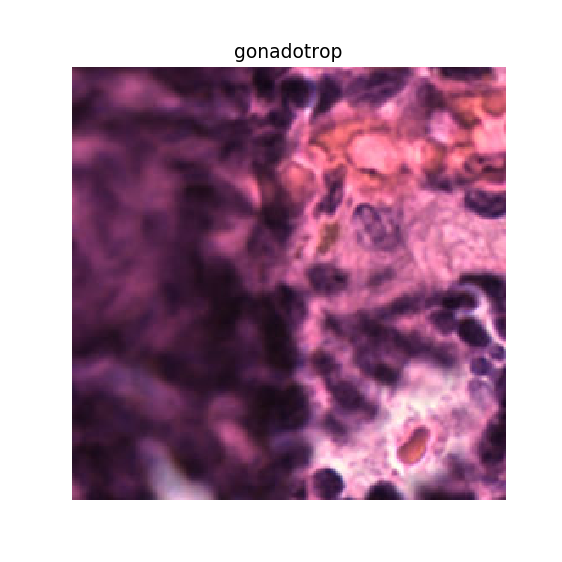

In [61]:
%matplotlib notebook
tile_image(wsi_om.tiles[1000]).show()

In [62]:
class TileTransform(Transform): 
    ''' A subclass of fastai Transform. Takes a TileObject and applies the image transform as taking tile object and returning 
    WsiImage aka PIL Image transformation.
    '''
    def __init__(self, tl:wsi_processing_pipeline.tile_extraction.tiles.Tile, splits):
        self.tl= tl
       
    def encodes(self,f):          
        
        return tile_image(f)   
    

We can now initialize our custom transform, we will ad the split at the validation set wwe defined earlier in our dataframe  


In [63]:
### if we had the dataframe exported....
#splits = ColSplitter('is_valid')(dataframe)
#tfm=WsiTransform(dataframe['fname'], splits=splits)
#tfm

In [65]:
splits = FuncSplitter(lambda x: x.is_valid)
tfm=TileTransform(wsi_om.tiles, splits=splits)
tfm

TileTransform: (object,object) -> encodes 

a transform ca be en and decoded--> see fastai2 documentation for further info

<IPython.core.display.Javascript object>


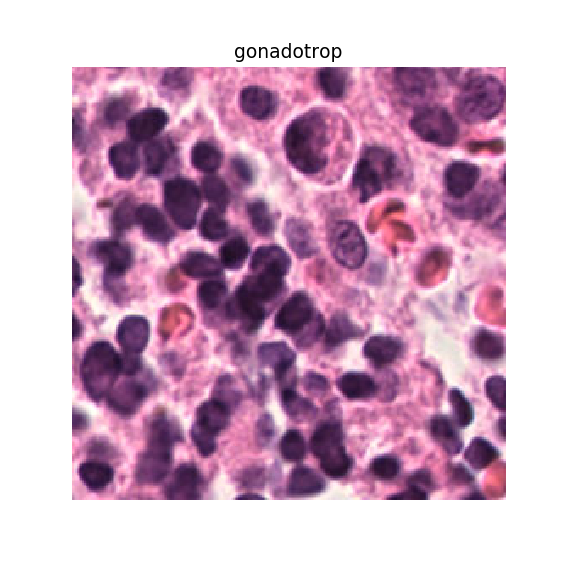

In [67]:

tfm.encodes(wsi_om.tiles[1009]).show()

we can create a datasets from our transforms

In [68]:

Datasets(tfm)

(#1) [(TileTransform: (object,object) -> encodes ,)]

than we create a TfmdLists  which is a Pipeline of tfms applied to a collection of items --> see fastai2 docs

In [71]:

tls = TfmdLists(wsi_om.tiles, tfm);tls

TfmdLists: [
[Tile #186006, Row #341, Column #366, Tissue 43.75%, Score 0.9890], 
[Tile #186555, Row #342, Column #369, Tissue 17.19%, Score 0.9821], 
[Tile #116037, Row #213, Column #285, Tissue 65.62%, Score 0.9582], 
[Tile #116035, Row #213, Column #283, Tissue 98.44%, Score 0.9515], 
[Tile #40694, Row #75, Column #290, Tissue 100.00%, Score 0.9489], 
[Tile #70719, Row #130, Column #285, Tissue 82.81%, Score 0.9482], 
[Tile #113450, Row #208, Column #428, Tissue 100.00%, Score 0.9434], 
[Tile #31426, Row #58, Column #304, Tissue 100.00%, Score 0.9357], 
[Tile #39596, Row #73, Column #284, Tissue 96.88%, Score 0.9354], 
[Tile #83485, Row #153, Column #493, Tissue 100.00%, Score 0.9248], 
[Tile #109083, Row #200, Column #429, Tissue 100.00%, Score 0.9216], 
[Tile #31972, Row #59, Column #304, Tissue 100.00%, Score 0.9206], 
[Tile #84027, Row #154, Column #489, Tissue 95.31%, Score 0.9205], 
[Tile #40695, Row #75, Column #291, Tissue 100.00%, Score 0.9204], 
[Tile #40690, Row #75, Colu

<IPython.core.display.Javascript object>


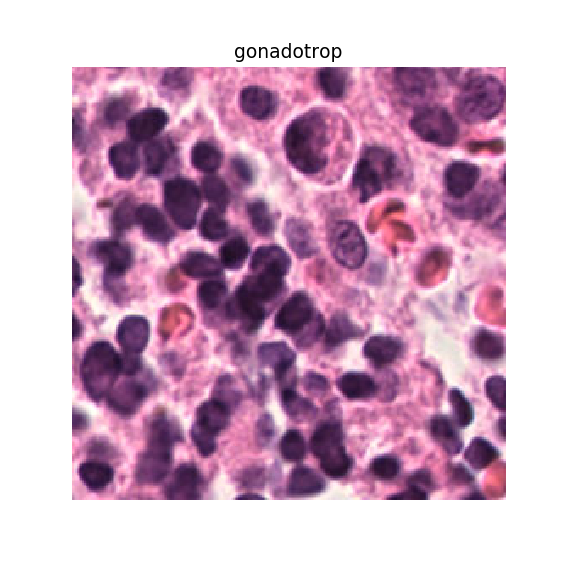

In [72]:
show_at(tls, 1009)

finally we create a dataloaders object which can then be used with a learner

In [73]:
dls = tls.dataloaders(bs=6)

In [74]:
dls.one_batch()

(TensorImage([[[[116, 128, 138,  ..., 114,  98,  86],
           [119, 131, 142,  ..., 126, 101,  83],
           [126, 140, 154,  ..., 141, 110,  89],
           ...,
           [169, 174, 168,  ..., 226, 221, 221],
           [159, 162, 160,  ..., 249, 250, 252],
           [175, 171, 161,  ..., 251, 253, 254]],
 
          [[ 52,  61,  65,  ...,  54,  44,  35],
           [ 52,  62,  67,  ...,  64,  45,  32],
           [ 57,  67,  75,  ...,  75,  51,  35],
           ...,
           [ 90,  90,  82,  ..., 175, 174, 177],
           [ 86,  82,  75,  ..., 206, 211, 217],
           [104,  93,  76,  ..., 217, 222, 228]],
 
          [[104, 114, 121,  ..., 116, 102,  91],
           [105, 116, 123,  ..., 127, 106,  89],
           [111, 122, 130,  ..., 139, 115,  97],
           ...,
           [145, 149, 145,  ..., 208, 208, 212],
           [142, 143, 140,  ..., 226, 232, 237],
           [164, 155, 143,  ..., 231, 237, 241]]],
 
 
         [[[159, 161, 164,  ..., 126, 124, 122],
    

In order for show_batch to work we need to tell this method that it is dealing eith the WsiImage we created... 
see x:WsiImage 
all is documented at the fastai2 docs

In [77]:
@typedispatch
def show_batch(x:TileImage, y, samples, ctxs=None, max_n=6, nrows=None, ncols=2, figsize=None, **kwargs):     
    if figsize is None: figsize = (ncols*6, max_n//ncols * 3)
    if ctxs is None: ctxs = get_grid(min(x[0].shape[0], max_n), nrows=None, ncols=ncols, figsize=figsize)      
    for i,ctx in enumerate(ctxs): TileImage(x[0][i], x[1][i]).show(ctx=ctx)

<IPython.core.display.Javascript object>


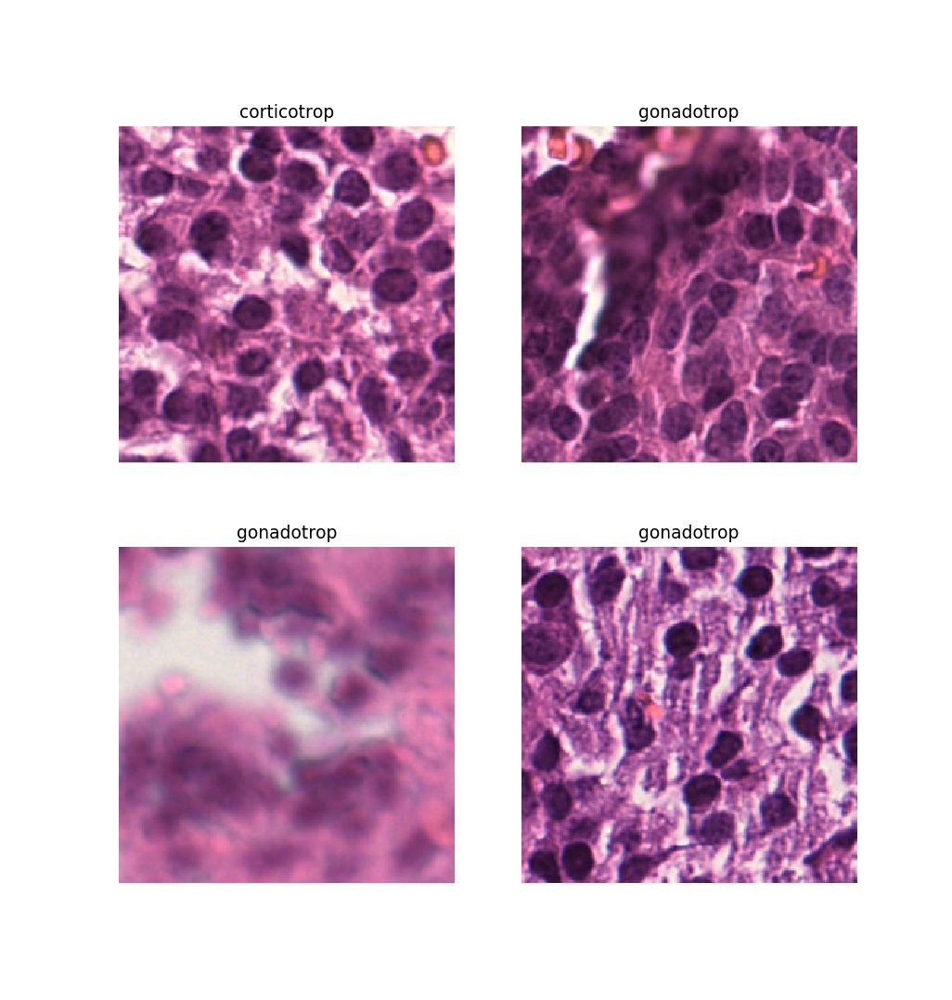

In [78]:
dls.show_batch()

again from the fastai2 docs...
working with WSI images is a very common use case, at least for us...
so it is nice to have a custom building block which can be seeminglessly used within the datablock api
this is how easy it is set up

In [79]:
def TileImageBlock(): return TransformBlock(type_tfms=TileImage.create, batch_tfms=IntToFloatTensor)

now we put together the final datablock..
receiving data from the dataframe
and utilising our cusom building block to mangae the Tile objects
with this set up you can plug in anything you want for your datablock creation.....

In [80]:
TileImageBlock()

In [124]:
### again if we had a dataframe...
#wsi = DataBlock(
#    blocks=(WsiImageBlock, CategoryBlock),
#    #get_items=get_tuple_files,
#    get_x=ColReader('fname'), 
#    get_y=ColReader('labels'),
#    splitter=ColSplitter('is_valid'),
#    item_tfms=Resize(224),
#    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
#)


wsi = DataBlock(
    blocks=(TileImageBlock, CategoryBlock),
    #get_items=get_tuple_files,
    get_x=lambda x: x, 
    get_y=lambda x: x.classification_labels,
    splitter=FuncSplitter(lambda x: x.is_valid),
    item_tfms=Resize(224),
    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
)


create a dataloaders for a learner

In [125]:
dls=wsi.dataloaders(wsi_om.tiles, bs=6)

we can see that it automagically transforms our tile into a tensorimage and takes óur labels as category

In [84]:
b = dls.one_batch()
explode_types(b)

{tuple: [fastai2.torch_core.TensorImage, fastai2.torch_core.TensorCategory]}

The nice thing here is that show batch now works out of the box!

<IPython.core.display.Javascript object>


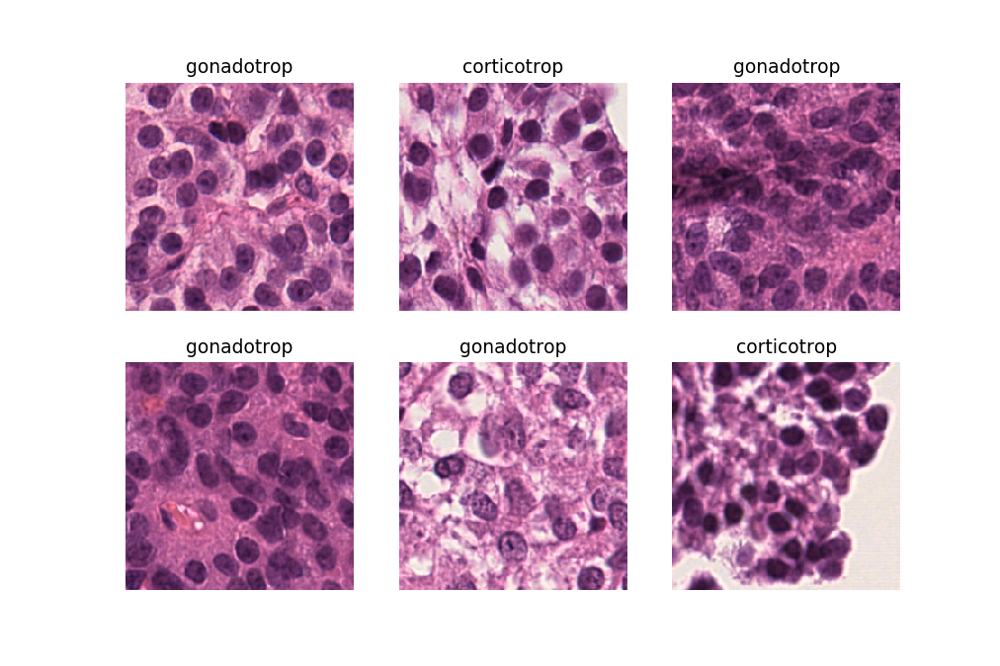

In [85]:
dls.show_batch()

One other great thing is that now the Datablock api can alos take the NamedObject as such from above...

In [114]:
png = DataBlock(
    blocks=(TileImageBlock, CategoryBlock),
    #get_items=get_tuple_files,
    get_x=lambda x: x, 
    get_y=lambda x: x.classification_labels,
    splitter=FuncSplitter(lambda x: x.is_valid),
    item_tfms=Resize(224),
    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
)


In [120]:
no[0].is_valid

True

In [122]:
png_dls=png.dataloaders(om.objects, bs=6)

<IPython.core.display.Javascript object>


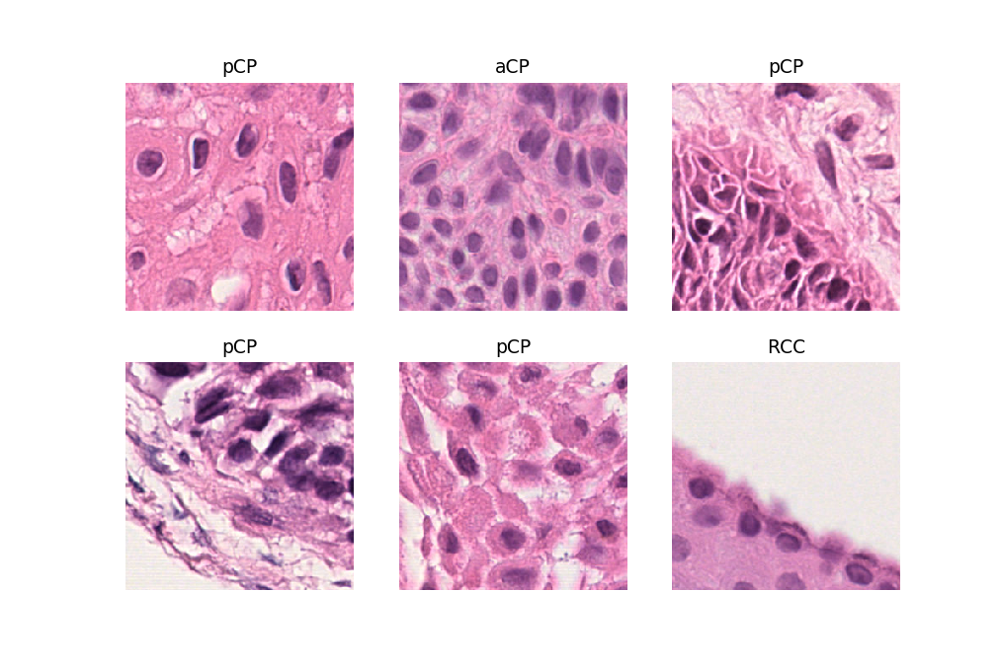

In [123]:
png_dls.show_batch()

Now let us create a learner and put everything up for training

In [134]:
epochs_frozen = 3
epochs_unfrozen = 5
arch = resnet34

sz = 512
#bs = 16

#fastai defaults
tta_beta = 0.4 
tta_scale = 1.35
dropout = 0.5
wd = 0.01

In [135]:
learner = cnn_learner(dls=png_dls, 
                     arch=arch, 
                     metrics=[accuracy, error_rate], 
                      
                     pretrained=True, 
                     wd = wd)

<IPython.core.display.Javascript object>


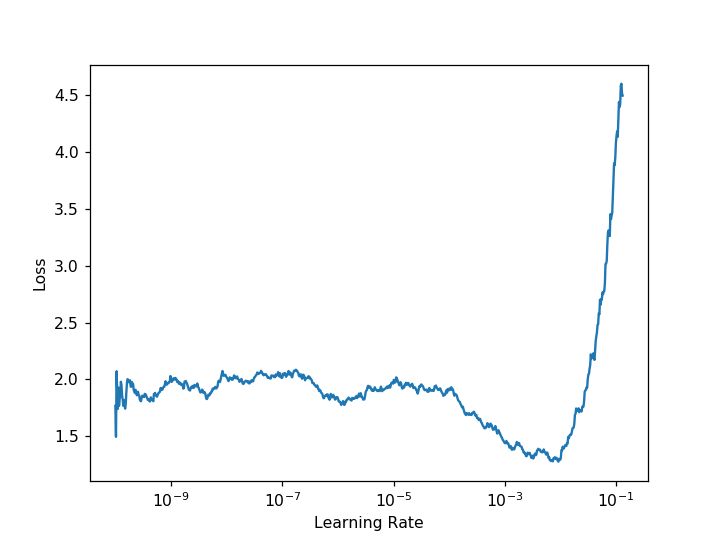

In [128]:
lr_min, lr_steep=learner.lr_find(start_lr=1e-10, end_lr=10, num_it=1000)

In [129]:
print(f"Minimum/10: {lr_min:.2e}, steepest point: {lr_steep:.2e}")

Minimum/10: 9.20e-04, steepest point: 1.25e-01


In [136]:
learner.fine_tune(epochs=epochs_frozen+epochs_unfrozen, 
                base_lr=9.20e-04, 
                freeze_epochs=epochs_frozen,
                cbs=[#SaveModelCallback(every_epoch=True, monitor='accuracy', 
                                                  # fname='bestmodel_head'), 
                                 EarlyStoppingCallback(monitor='valid_loss', comp=None, min_delta=0.1, patience=2),
                                 TerminateOnNaNCallback() ])

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.460735,1.086164,0.584730,0.415270,32:00
1,0.385039,1.070964,0.646049,0.353951,14:13
2,0.379492,0.979708,0.641793,0.358207,14:26


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.240236,1.041115,0.613860,0.386140,17:58
1,0.270805,1.405877,0.525539,0.474461,18:00
2,0.196587,0.867567,0.707236,0.292764,18:14
3,0.142442,0.995902,0.687417,0.312583,20:04
4,0.182162,0.864065,0.731312,0.268688,18:58


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5e512db560>
Traceback (most recent call last):
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 961, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 941, in _shutdown_workers
    w.join()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5e512db560>
Traceback (most recent call last):
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 961, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 941, in _shutd

    self._shutdown_workers()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 941, in _shutdown_workers
    w.join()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5e512db560>
Traceback (most recent call last):
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 961, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 941, in _shutdown_workers
    w.join()
  File "/opt/conda/envs/DLM_Py3/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process

No improvement since epoch 2: early stopping


<IPython.core.display.Javascript object>


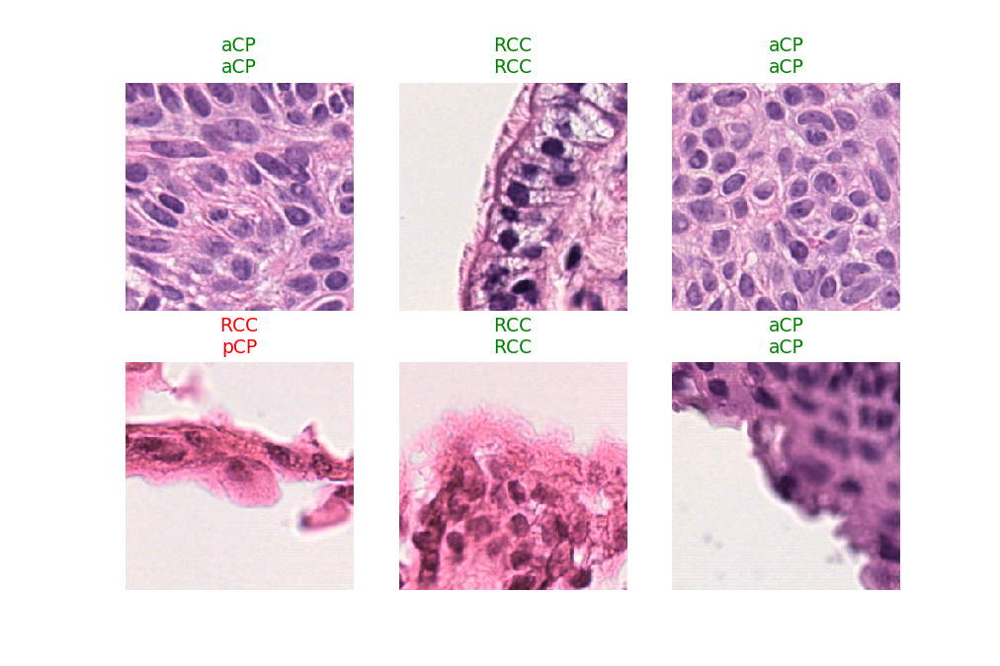

In [138]:
%matplotlib notebook
learner.show_results()

In [139]:
learner.validate()

(#3) [0.8640651106834412,0.7313115000724792,0.26868847012519836]